# Collaborator Taxonomy Analysis

This notebook is a reporting layer over reusable helper functions in `src/notebook_academic_collab_helpers.py`.
It focuses on clear outputs: summary statistics, ranked tables, and figures.


## Workflow

1. Load classifier output and prepare normalized organization fields.
2. Compute collaboration flags and paper-level collaborator contribution counts.
3. Produce summary statistics and top collaborator tables.
4. Visualize collaborator patterns over organizations, time, discipline, and geography.
5. Report top-cited papers for selected taxonomy-sector subsets.


In [1]:
from pathlib import Path
import importlib
import sys

import pandas as pd
from IPython.display import display

src_dir = Path.cwd() / "src"
if str(src_dir) not in sys.path:
    sys.path.append(str(src_dir))

import notebook_academic_collab_helpers as h
importlib.reload(h)

h.apply_project_plot_style()

ANALYSIS_DATA_CANDIDATES = [
    Path("output/non_academic_flagged_full_company.xlsx"),
    Path("output/non_academic_flagged_full_company.progress.csv"),
    Path("src/output/non_academic_flagged_full_company.xlsx"),
    Path("src/output/non_academic_flagged_full_company.progress.csv"),
]
existing_inputs = [p for p in ANALYSIS_DATA_CANDIDATES if p.exists()]
if existing_inputs:
    ANALYSIS_DATA_PATH = max(existing_inputs, key=lambda p: p.stat().st_mtime)
else:
    ANALYSIS_DATA_PATH = h.find_data_path()

print(f"Analysis input (explicit): {ANALYSIS_DATA_PATH.resolve()}")


Analysis input (explicit): /home/jinx/Dropbox/20_years_of_ukb/src/output/non_academic_flagged_full_company.xlsx


## 1. Data Loading and Preparation

This step finds the newest available classifier output, loads it, then applies standardized parsing and normalization.


In [2]:
df, data_path, raw_df = h.load_and_prepare_dataframe(
    data_path=ANALYSIS_DATA_PATH,
    require_sector_columns=True,
)

print(f"Loaded file: {data_path}")
print(f"Loaded raw rows: {len(raw_df)}")
print(f"Rows after data preparation: {len(df)}")
print(f"Rows with parsed institutions: {(df['all_institutions'].map(len) > 0).sum()}")
print(f"Rows with any non-academic org parsed: {(df['non_academic_institutions_norm'].map(len) > 0).sum()}")
print(f"Rows with any company parsed: {(df['company_institutions_norm'].map(len) > 0).sum()}")
print(f"Rows with parsed affiliation mentions: {(df['affiliation_names'].map(len) > 0).sum()}")

if len(df) <= 1000:
    print(
        "WARNING: loaded a small dataset (<=1000 rows). "
        "If unexpected, check input file selection."
    )


Loaded file: output/non_academic_flagged_full_company.xlsx
Loaded raw rows: 10846
Rows after data preparation: 10846
Rows with parsed institutions: 10714
Rows with any non-academic org parsed: 10302
Rows with any company parsed: 788
Rows with parsed affiliation mentions: 10310


## 2. Core Statistics and Top Collaborators

Statistics are computed from taxonomy sectors using paper-level collaborator organization contributions.


In [3]:
top_sector_tables, unique_counts = h.build_top_sector_collaborator_tables(df, n=30)
stats = h.compute_summary_stats(df, unique_counts=unique_counts)

for line in h.summary_stats_as_lines(stats):
    print(line)

for label in h.NON_ACADEMIC_SECTOR_LABELS:
    table = top_sector_tables.get(label, pd.DataFrame()).head(10)
    if table.empty:
        print(f"Top {label} collaborators: none")
        continue
    display(table.style.set_caption(f"Top {label} collaborators"))


Total papers: 10846
Papers with any taxonomy sector collaborator: 10302 (94.98%)
Papers with any company collaborator: 788 (7.27%)
Papers with Company (non-UK): 701 (6.46%)
Papers with UK company: 118 (1.09%)
University/HEI: 26513 mentions (58.2%), 9420 papers (91.4%), mean orgs/paper=2.444
Unique University/HEI institutions: 1181
Hospital/Clinical: 12085 mentions (26.5%), 5766 papers (56.0%), mean orgs/paper=1.114
Unique Hospital/Clinical institutions: 1187
Government/Public: 1848 mentions (4.1%), 1386 papers (13.5%), mean orgs/paper=0.17
Unique Government/Public institutions: 177
Research institute/Centre: 2144 mentions (4.7%), 1463 papers (14.2%), mean orgs/paper=0.198
Unique Research institute/Centre institutions: 245
Nonprofit/Charity: 1889 mentions (4.1%), 1429 papers (13.9%), mean orgs/paper=0.174
Unique Nonprofit/Charity institutions: 162
Company (non-UK): 894 mentions (2.0%), 701 papers (6.8%), mean orgs/paper=0.082
Unique Company (non-UK) institutions: 189
UK company: 124 men

,org,papers
0,Harvard University,1141
1,University of Oxford,947
2,University of Cambridge,537
3,King's College London,512
4,Imperial College London,478
5,University of Edinburgh,471
6,University of Bristol,372
7,Fudan University,329
8,University of Queensland,327
9,Zhejiang University,323


,org,papers
0,Massachusetts General Hospital,637
1,Brigham and Womens Hospital Inc,481
2,Tongji Medical College of Huazhong University of Science and Technology,250
3,Erasmus MC,205
4,University Medical Center Utrecht,188
5,Vanderbilt University Medical Center,165
6,University Medical Center Groningen,159
7,Huashan Hospital,155
8,West China Hospital of Sichuan University,153
9,Leiden University Medical Center,138


,org,papers
0,Ministry of Education of the People's Republic of China,151
1,National Cancer Institute,125
2,National Institute on Aging,95
3,NIHR Oxford Musculoskeletal Biomedical Research Centre,95
4,Finnish Institute for Health and Welfare,75
5,National Institutes of Health,69
6,National Heart Lung and Blood Institute,65
7,State Key Laboratory of Genetic Engineering,57
8,Norwegian Institute of Public Health,53
9,Statens Serum Institut,50


,org,papers
0,MRC Epidemiology Unit,180
1,QIMR Berghofer Medical Research Institute,173
2,Institute for Molecular Medicine Finland,128
3,German Centre for Cardiovascular Research,93
4,Wellcome Centre for Integrative Neuroimaging,87
5,MRC Human Genetics Unit,85
6,Amsterdam Neuroscience,72
7,Centro de Investigación Biomédica en Red de Epidemiología y Salud Pública,69
8,MRC Lifecourse Epidemiology Unit,57
9,Singapore Eye Research Institute,45


,org,papers
0,Broad Institute,661
1,Wellcome Sanger Institute,139
2,Health Data Research UK,112
3,Kaiser Permanente,77
4,Swiss Institute of Bioinformatics,67
5,UCL Institute of Ophthalmology,49
6,Garvan Institute of Medical Research,36
7,Murdoch Children's Research Institute,34
8,Cancer Council Victoria,32
9,Institut Pasteur,30


,org,papers
0,Decode Genetics ehf,97
1,23andMe Inc,77
2,Regeneron Pharmaceuticals Inc,74
3,Genentech Inc,29
4,GlaxoSmithKline LLC,26
5,Verve Therapeutics Inc,26
6,Biogen Inc,25
7,Calico Life Sciences LLC,24
8,Fimlab (Finland),24
9,AMRA Medical (Sweden),23


,org,papers
0,Novo Nordisk Research Centre Oxford Ltd,45
1,GlaxoSmithKline Research and Development Ltd,23
2,Genomics PLC,13
3,Genomics England Ltd,10
4,Huma Therapeutics Ltd,5
5,Siemens Healthcare Ltd,3
6,Microsoft Research (United Kingdom),2
7,Edinburgh BioQuarter (United Kingdom),2
8,BenevolentAI Ltd,2
9,AstraZeneca PLC,2


,org,papers
0,Ikerbasque,11
1,Cancer Registry of Norway,8
2,British Library,5
3,China National GeneBank,3
4,FrontLine Service,1
5,Musée de l'Homme,1
6,Church of England,1
7,Tyne and Wear Archives and Museums,1
8,National Museum of Antiquities,1
9,Landesmuseum Württemberg,1


## 3. Collaborator Sector Taxonomy

Sector labels are assigned per collaborator using structured `research_orgs` metadata and classifier indices (academic + non-academic union).

Taxonomy used:
- University/HEI
- Hospital/Clinical
- Government/Public
- Research institute/Centre
- Nonprofit/Charity
- Company (non-UK)
- UK company
- Other/Unknown


Collaborator taxonomy summary (derived from research_orgs + index mapping):


,sector,institution_mentions,papers,mentions_pct,papers_pct_of_non_academic_papers,papers_pct_of_taxonomy_papers
0,University/HEI,26513,9420,58.2,91.438556,91.4
1,Hospital/Clinical,12085,5766,26.5,55.969715,56.0
2,Government/Public,1848,1386,4.1,13.453698,13.5
3,Research institute/Centre,2144,1463,4.7,14.201126,14.2
4,Nonprofit/Charity,1889,1429,4.1,13.871093,13.9
5,Company (non-UK),894,701,2.0,6.804504,6.8
6,UK company,124,118,0.3,1.145409,1.1
7,Other/Unknown,36,33,0.1,0.320326,0.3


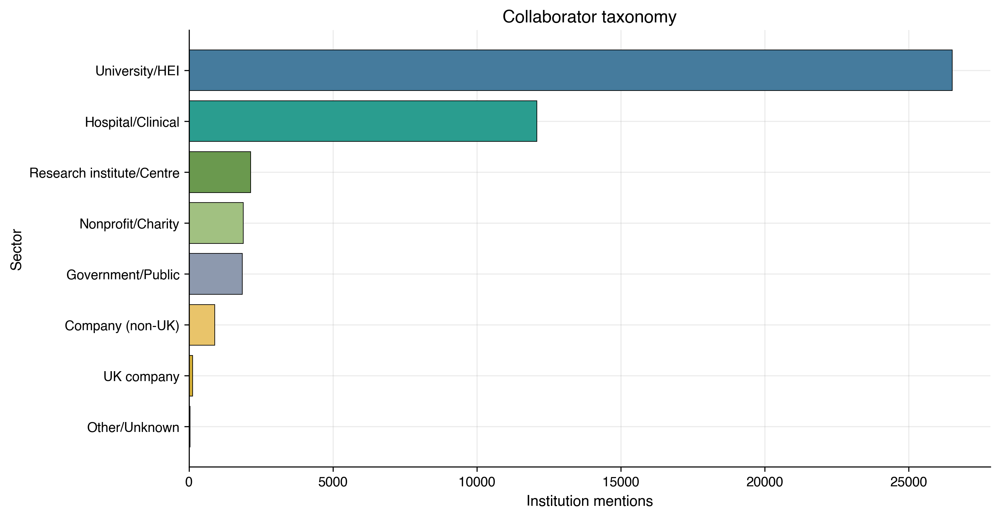

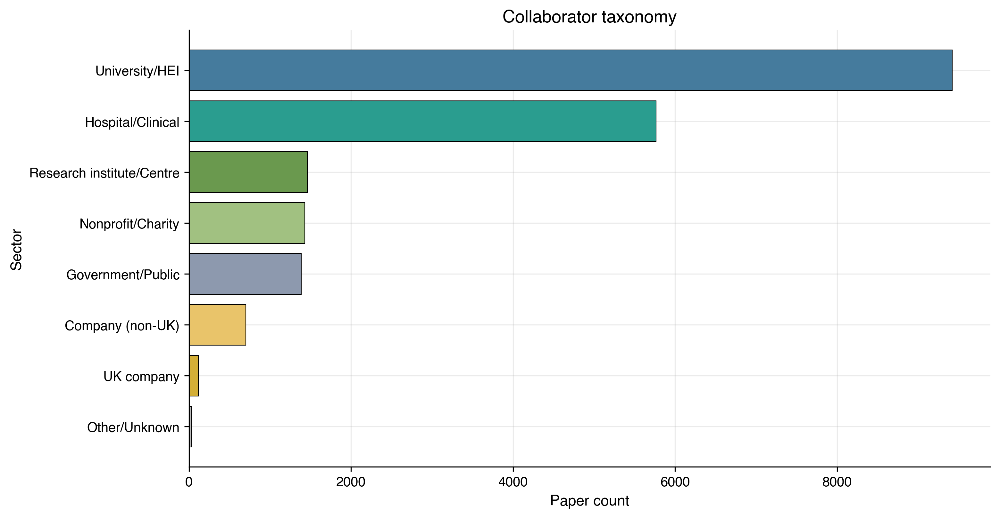

In [4]:
sector_summary_df = h.build_non_academic_sector_summary(df)

print("Collaborator taxonomy summary (derived from research_orgs + index mapping):")
display(
    sector_summary_df.assign(
        mentions_pct=lambda d: d["mentions_pct"].round(1),
        papers_pct_of_taxonomy_papers=lambda d: d["papers_pct_of_taxonomy_papers"].round(1),
    )
)

h.plot_non_academic_sector_breakdown(sector_summary_df, value_col="institution_mentions")
h.plot_non_academic_sector_breakdown(sector_summary_df, value_col="papers")


## 4. Organization-Level Distributions and Rankings

Organization rankings and prevalence figures are shown by taxonomy sector.


Top Hospital/Clinical collaborators:


,org,papers
0,Massachusetts General Hospital,637
1,Brigham and Womens Hospital Inc,481
2,Tongji Medical College of Huazhong University ...,250
3,Erasmus MC,205
4,University Medical Center Utrecht,188
5,Vanderbilt University Medical Center,165
6,University Medical Center Groningen,159
7,Huashan Hospital,155
8,West China Hospital of Sichuan University,153
9,Leiden University Medical Center,138


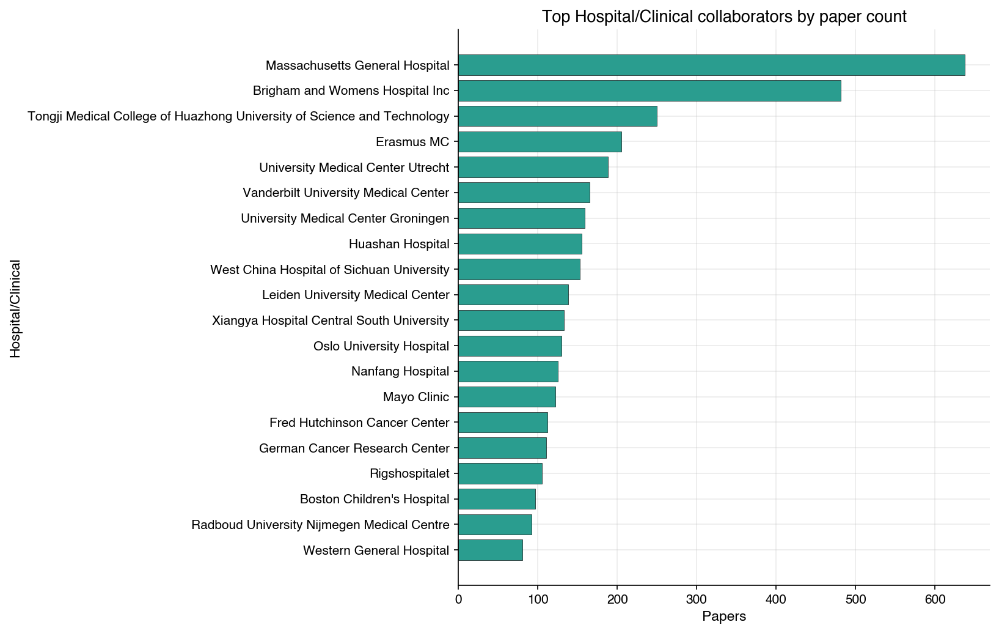

Top University/HEI collaborators:


,org,papers
0,Harvard University,1141
1,University of Oxford,947
2,University of Cambridge,537
3,King's College London,512
4,Imperial College London,478
5,University of Edinburgh,471
6,University of Bristol,372
7,Fudan University,329
8,University of Queensland,327
9,Zhejiang University,323


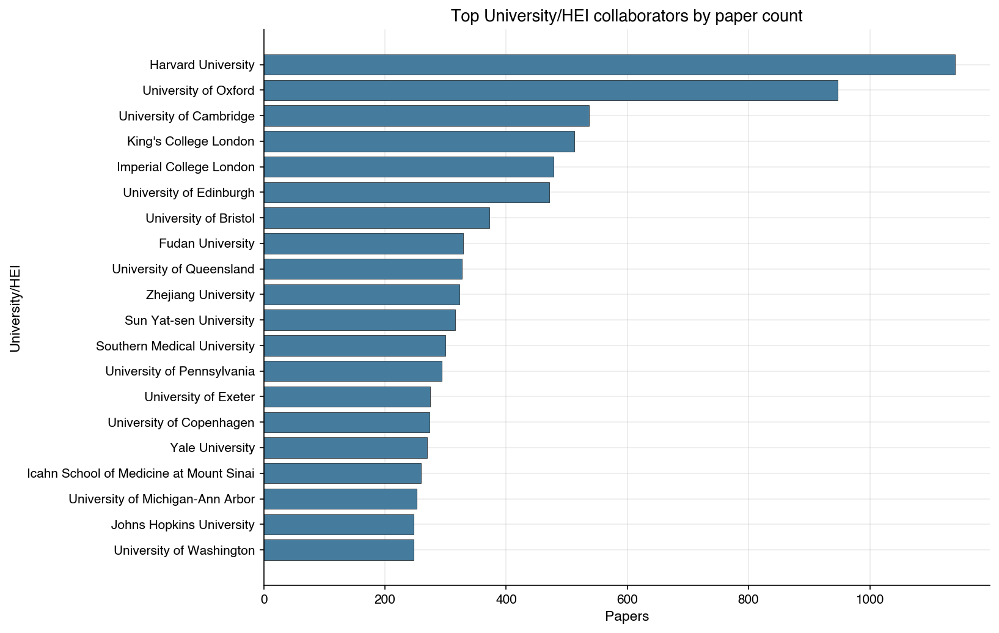

Top Government/Public collaborators:


,org,papers
0,Ministry of Education of the People's Republic...,151
1,National Cancer Institute,125
2,National Institute on Aging,95
3,NIHR Oxford Musculoskeletal Biomedical Researc...,95
4,Finnish Institute for Health and Welfare,75
5,National Institutes of Health,69
6,National Heart Lung and Blood Institute,65
7,State Key Laboratory of Genetic Engineering,57
8,Norwegian Institute of Public Health,53
9,Statens Serum Institut,50


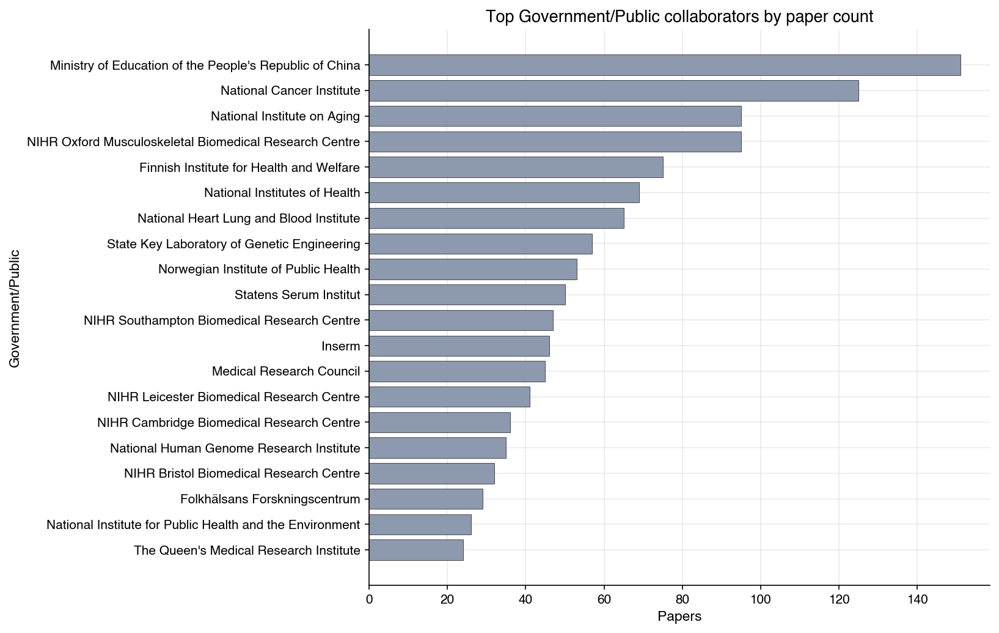

Top Research institute/Centre collaborators:


,org,papers
0,MRC Epidemiology Unit,180
1,QIMR Berghofer Medical Research Institute,173
2,Institute for Molecular Medicine Finland,128
3,German Centre for Cardiovascular Research,93
4,Wellcome Centre for Integrative Neuroimaging,87
5,MRC Human Genetics Unit,85
6,Amsterdam Neuroscience,72
7,Centro de Investigación Biomédica en Red de Ep...,69
8,MRC Lifecourse Epidemiology Unit,57
9,Singapore Eye Research Institute,45


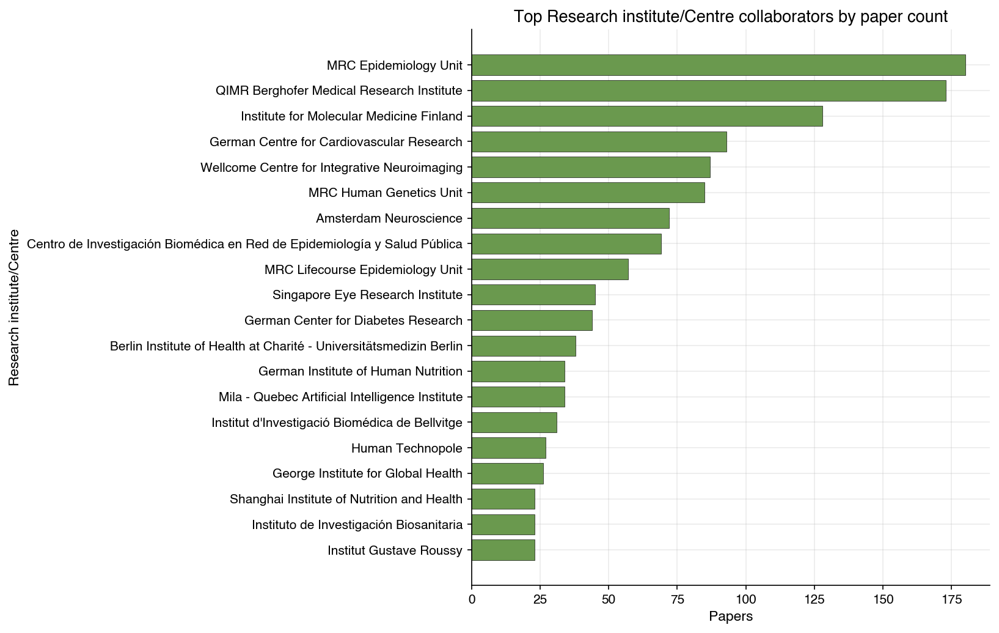

Top Nonprofit/Charity collaborators:


,org,papers
0,Broad Institute,661
1,Wellcome Sanger Institute,139
2,Health Data Research UK,112
3,Kaiser Permanente,77
4,Swiss Institute of Bioinformatics,67
5,UCL Institute of Ophthalmology,49
6,Garvan Institute of Medical Research,36
7,Murdoch Children's Research Institute,34
8,Cancer Council Victoria,32
9,Institut Pasteur,30


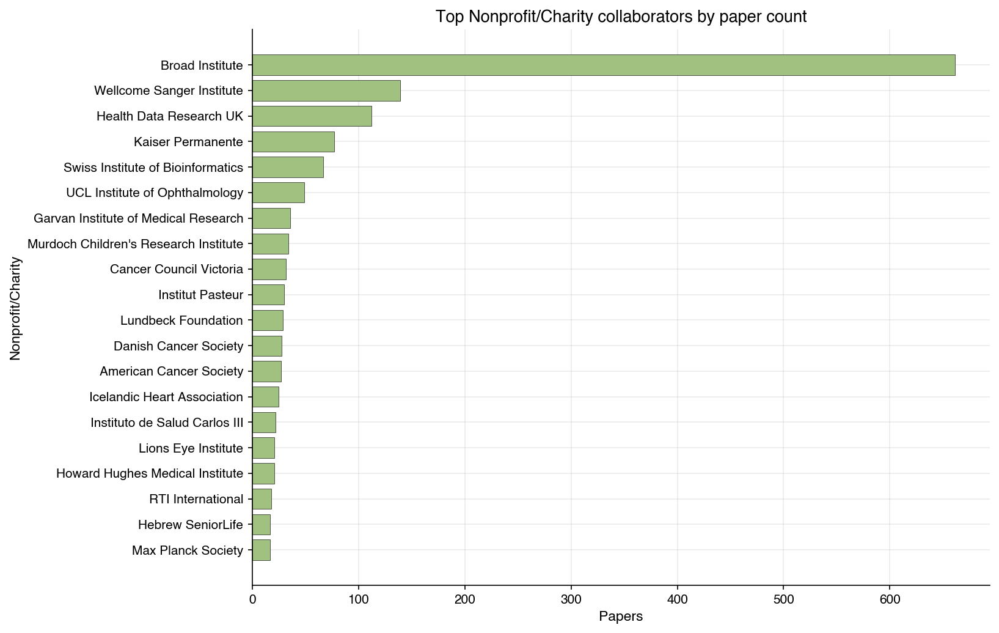

Top Company (non-UK) collaborators:


,org,papers
0,Decode Genetics ehf,97
1,23andMe Inc,77
2,Regeneron Pharmaceuticals Inc,74
3,Genentech Inc,29
4,GlaxoSmithKline LLC,26
5,Verve Therapeutics Inc,26
6,Biogen Inc,25
7,Calico Life Sciences LLC,24
8,Fimlab (Finland),24
9,AMRA Medical (Sweden),23


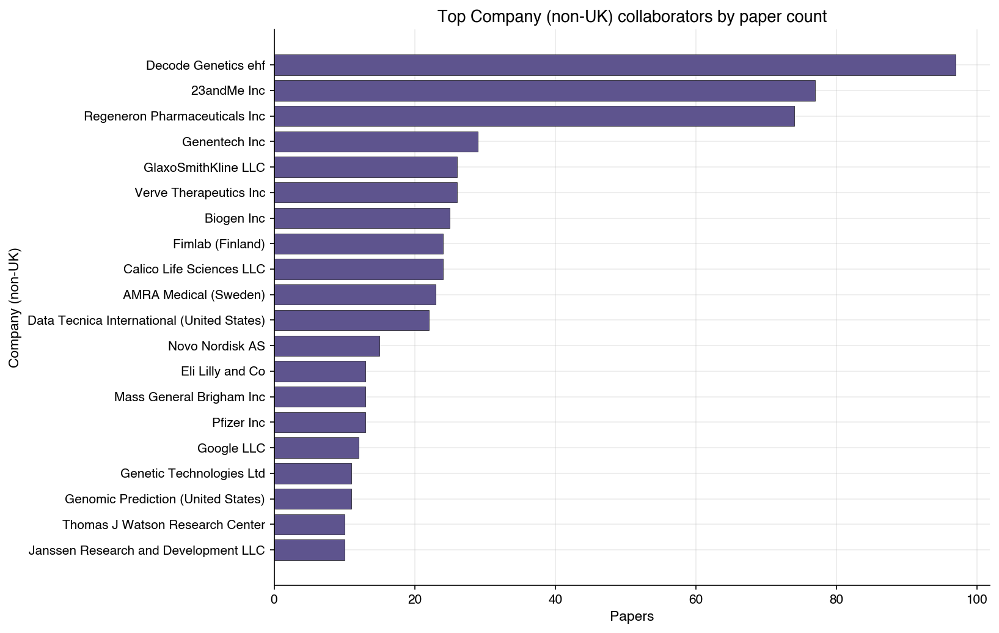

Top UK company collaborators:


,org,papers
0,Novo Nordisk Research Centre Oxford Ltd,45
1,GlaxoSmithKline Research and Development Ltd,23
2,Genomics PLC,13
3,Genomics England Ltd,10
4,Huma Therapeutics Ltd,5
5,Siemens Healthcare Ltd,3
6,Microsoft Research (United Kingdom),2
7,Edinburgh BioQuarter (United Kingdom),2
8,BenevolentAI Ltd,2
9,AstraZeneca PLC,2


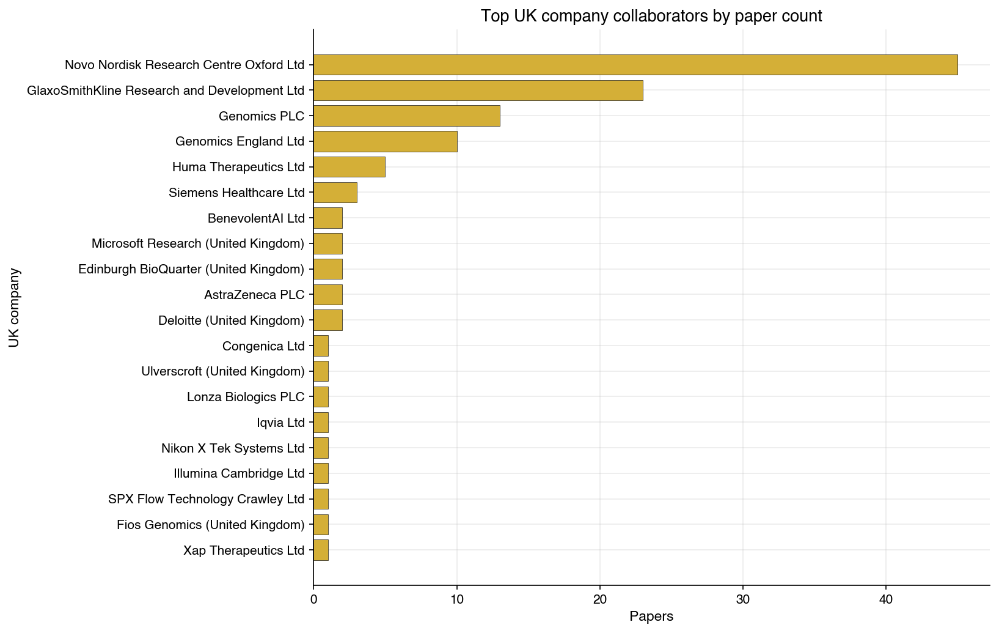

Top Other/Unknown collaborators:


,org,papers
0,Ikerbasque,11
1,Cancer Registry of Norway,8
2,British Library,5
3,China National GeneBank,3
4,FrontLine Service,1
5,Musée de l'Homme,1
6,Church of England,1
7,Tyne and Wear Archives and Museums,1
8,National Museum of Antiquities,1
9,Landesmuseum Württemberg,1


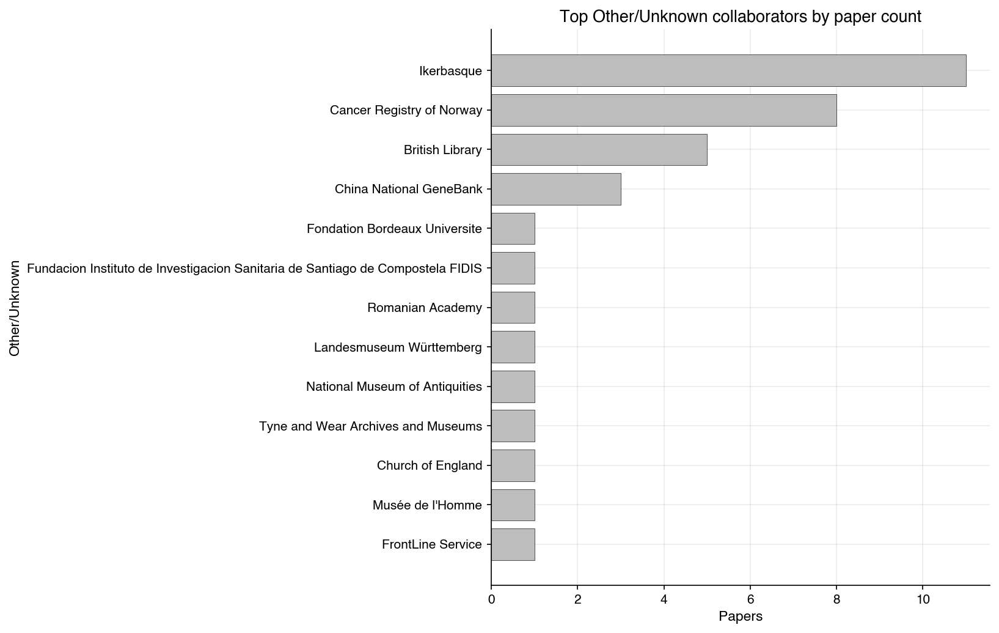

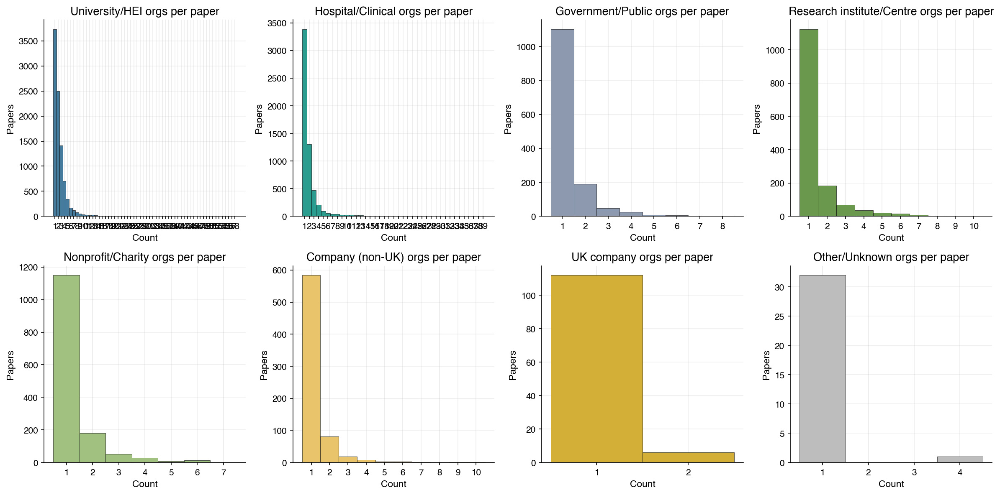

In [5]:
sector_order = [
    "Hospital/Clinical",
    "University/HEI",
    "Government/Public",
    "Research institute/Centre",
    "Nonprofit/Charity",
    "Company (non-UK)",
    "UK company",
    "Other/Unknown",
]
sector_colors = {
    "Hospital/Clinical": "#2A9D8F",
    "University/HEI": "#457B9D",
    "Government/Public": "#8D99AE",
    "Research institute/Centre": "#6A994E",
    "Nonprofit/Charity": "#A1C181",
    "Company (non-UK)": "#5E548E",
    "UK company": "#D4AF37",
    "Other/Unknown": "#BDBDBD",
}

for label in sector_order:
    table = top_sector_tables.get(label, pd.DataFrame())
    print(f"Top {label} collaborators:")
    display(table.head(25))
    if not table.empty:
        h.plot_top_orgs(
            table,
            f"Top {label} collaborators by paper count",
            "Papers",
            label,
            sector_colors.get(label, "#BDBDBD"),
        )

h.plot_collaborator_count_distributions(df)


## 5. Time Trends

Three views are shown:
- cumulative paper counts by taxonomy sector,
- annual share of all papers by taxonomy sector,
- annual share of taxonomy-collaboration papers that include company sectors.


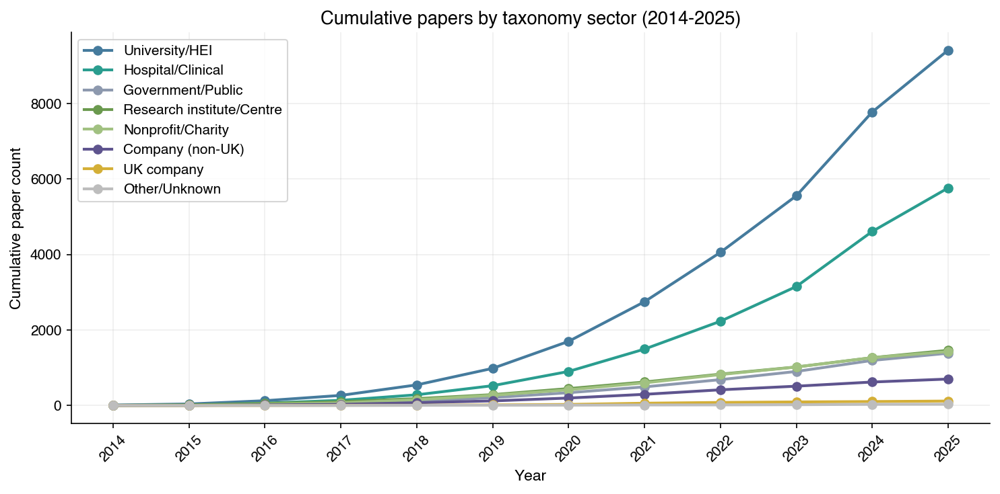

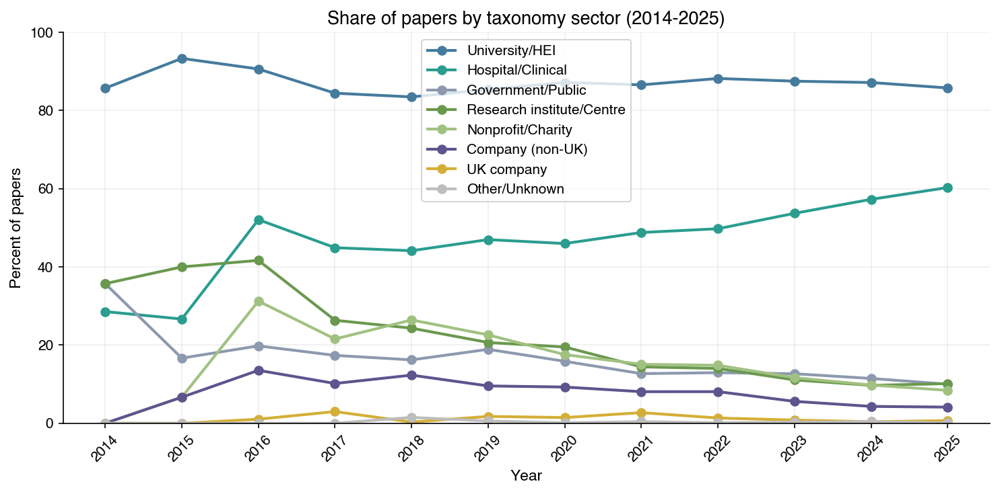

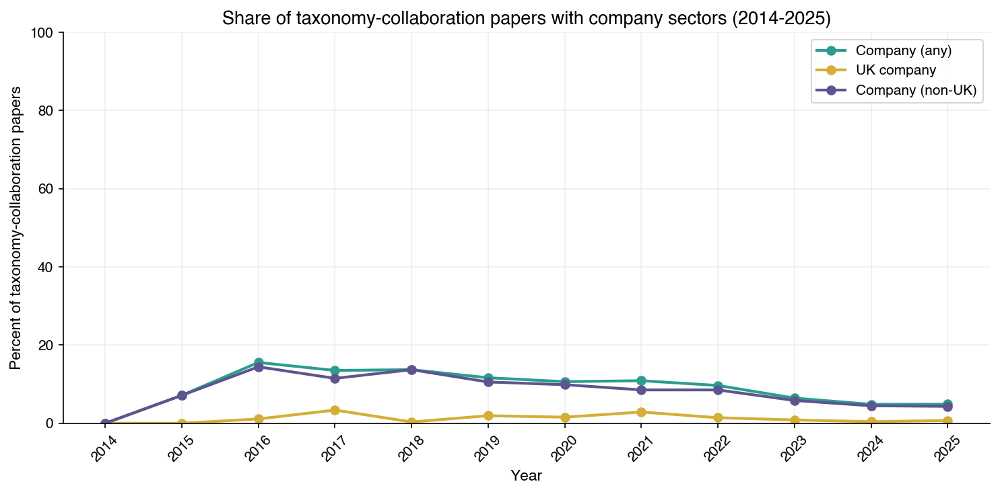

In [6]:
df = h.ensure_year_column(df)

h.plot_cumulative_by_type(df, start_year=2014, end_year=2025)
h.plot_yearly_share_by_type(df, start_year=2014, end_year=2025)
h.plot_company_share_within_non_academic(df, start_year=2014, end_year=2025)


## 6. Additional Publication Figures

These figures summarize taxonomy-sector structure and impact:
- annual primary-sector mix in counts and 100% shares,
- overlap heatmap of taxonomy sector flags,
- citation distributions and yearly median citation trajectories by taxonomy groups,
- collaborator concentration curves,
- top-journal company-sector share comparisons.


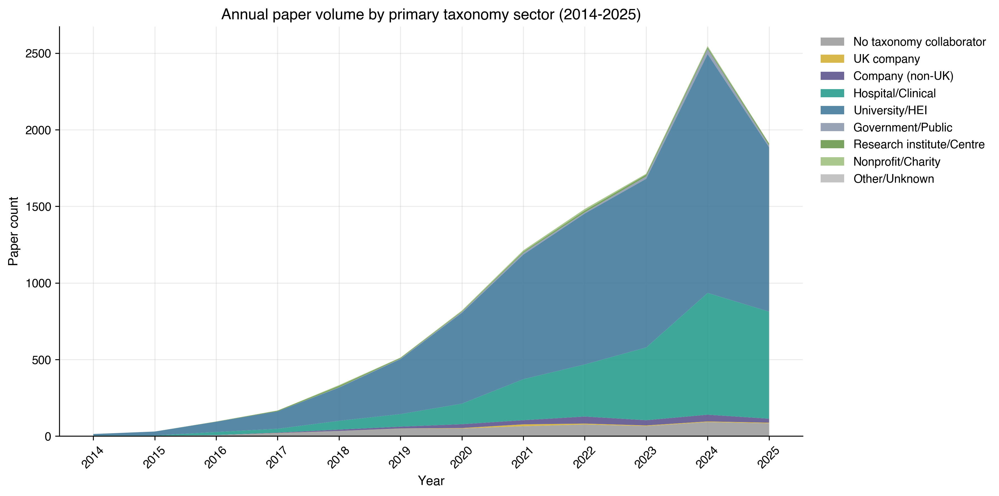

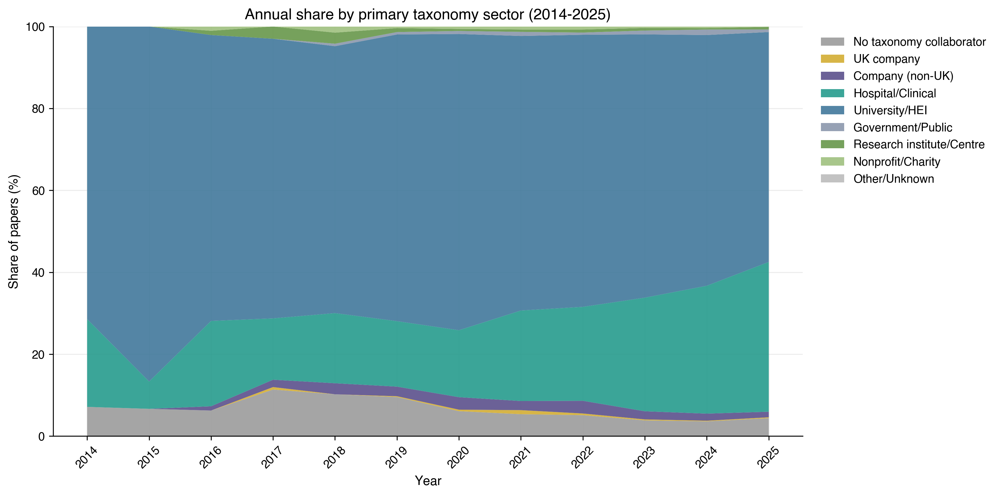

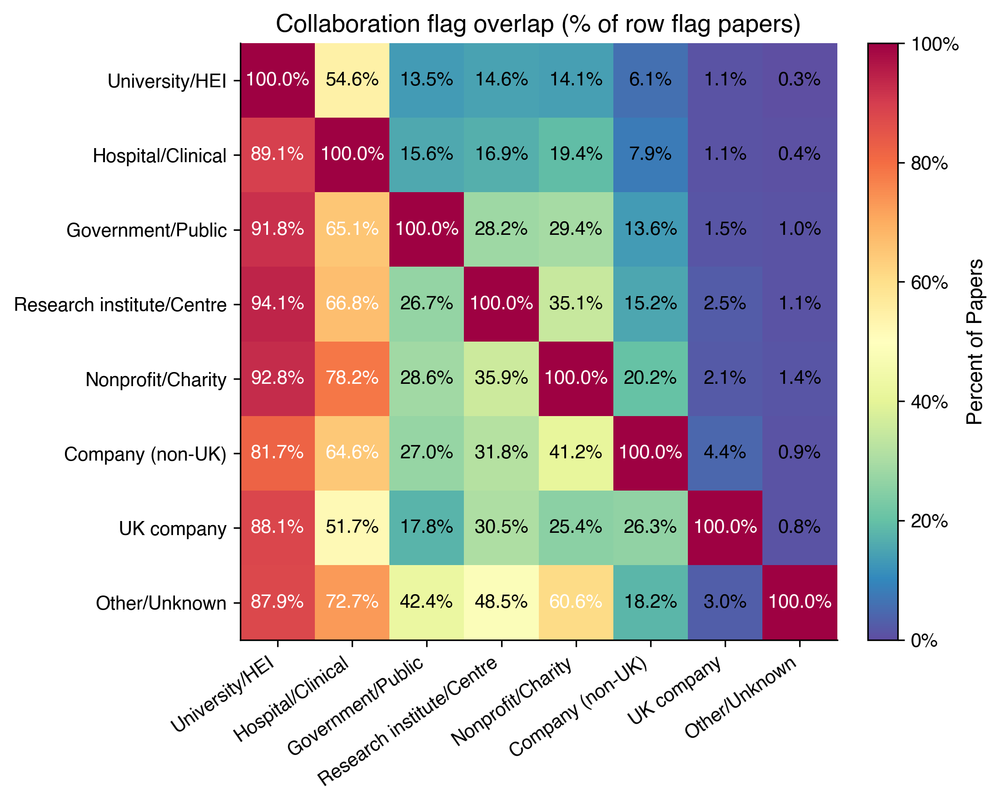

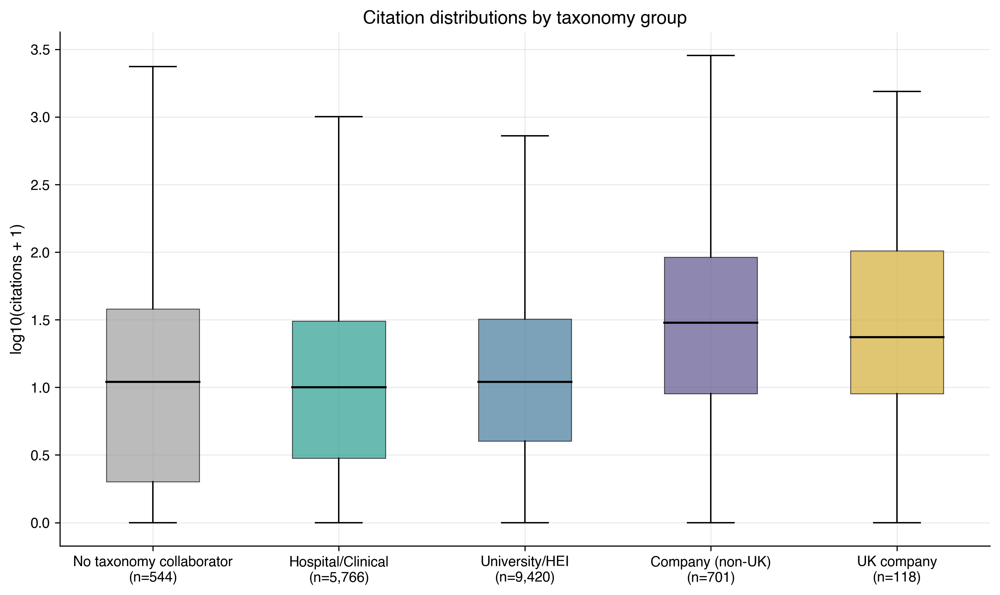

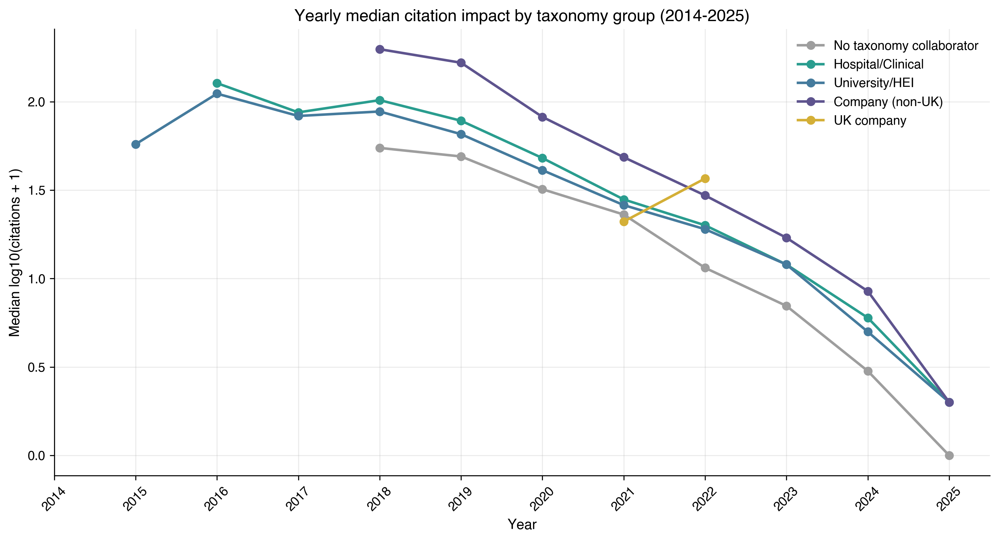

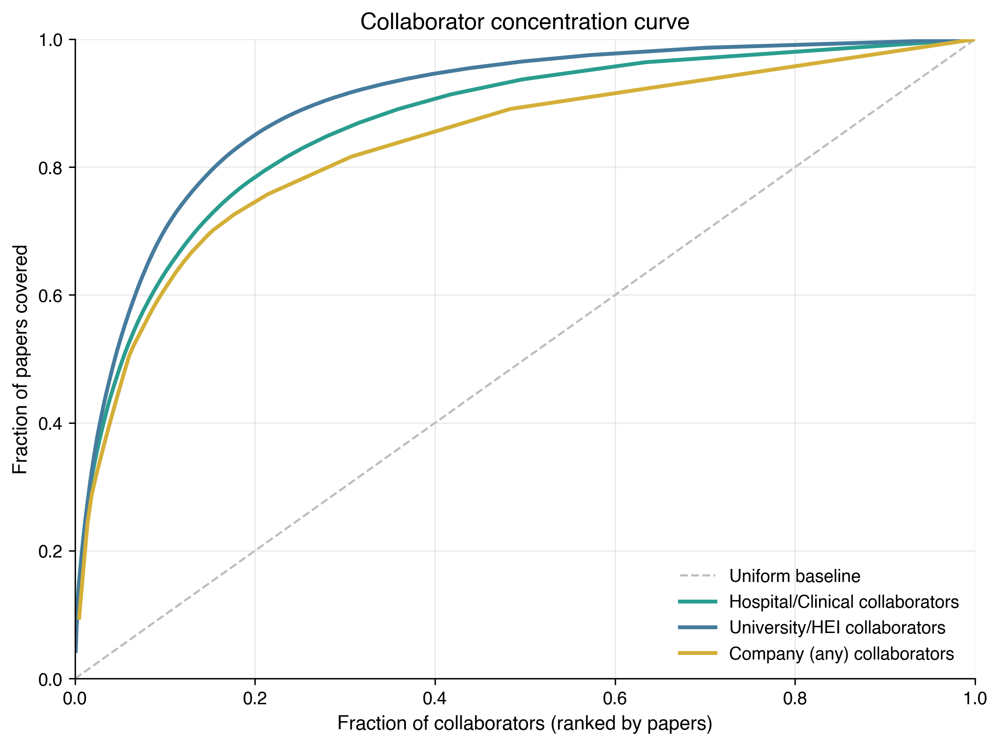

Top journals by paper volume with company-share metrics:


,journal_name,papers,company_papers,uk_company_papers,any_sector_papers,company_share,uk_company_share,any_sector_share
0,Nature Communications,433,93,11,419,0.214781,0.025404,0.967667
1,Scientific Reports,291,22,3,276,0.075601,0.010309,0.948454
2,Nature Genetics,218,81,10,203,0.371560,0.045872,0.931193
3,BMC Medicine,210,4,2,202,0.019048,0.009524,0.961905
4,The American Journal of Human Genetics,160,28,5,156,0.175000,0.031250,0.975000
5,Nutrients,117,2,1,116,0.017094,0.008547,0.991453
6,PLOS ONE,113,13,3,102,0.115044,0.026549,0.902655
7,Journal of Affective Disorders,110,1,0,105,0.009091,0.000000,0.954545
8,PLOS Genetics,106,16,2,104,0.150943,0.018868,0.981132
9,International Journal of Epidemiology,95,3,1,91,0.031579,0.010526,0.957895


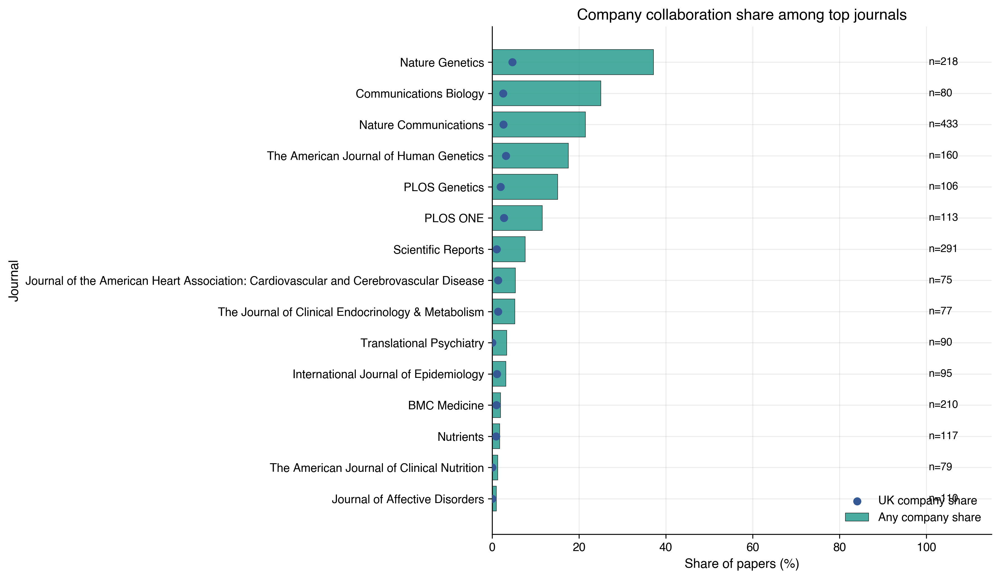

In [7]:
h.plot_collaboration_mix_stacked_area(df, start_year=2014, end_year=2025)
h.plot_collaboration_mix_share_stacked_area(df, start_year=2014, end_year=2025)
h.plot_flag_overlap_heatmap(df)
h.plot_citation_distribution_by_group(df, citation_col="times_cited")
h.plot_yearly_median_log_citations_by_group(
    df,
    citation_col="times_cited",
    start_year=2014,
    end_year=2025,
    min_papers_per_point=20,
)
h.plot_collaborator_concentration_curves(df)

journal_company_df = h.build_journal_company_table(df, top_n=20, min_papers=25)
print("Top journals by paper volume with company-share metrics:")
display(journal_company_df)
h.plot_top_journal_company_share(journal_company_df, top_n=15)


## 7. Advanced Dynamics and Diagnostics

This section extends taxonomy analysis with annual diagnostics on:
- volume/share dynamics by sector,
- UK vs non-UK company composition,
- collaborator churn (new vs returning companies),
- persistence of top company collaborators over time.


Yearly collaboration metrics:


,year,papers_total,papers_any_sector,share_any_sector_pct,papers_university_hei,share_university_hei_pct,papers_hospital_clinical,share_hospital_clinical_pct,papers_government_public,share_government_public_pct,papers_research_institute_centre,share_research_institute_centre_pct,papers_nonprofit_charity,share_nonprofit_charity_pct,papers_company_non_uk,share_company_non_uk_pct,papers_uk_company,share_uk_company_pct,share_company_any_pct,company_share_yoy_delta_pp
0,2014,14,13,92.857143,12,85.714286,4,28.571429,5,35.714286,5,35.714286,0,0.000000,0,0.000000,0,0.000000,0.000000,NaN
1,2015,30,28,93.333333,28,93.333333,8,26.666667,5,16.666667,12,40.000000,2,6.666667,2,6.666667,0,0.000000,6.666667,6.666667
2,2016,96,90,93.750000,87,90.625000,50,52.083333,19,19.791667,40,41.666667,30,31.250000,13,13.541667,1,1.041667,14.583333,7.916667
3,2017,167,148,88.622754,141,84.431138,75,44.910180,29,17.365269,44,26.347305,36,21.556886,17,10.179641,5,2.994012,13.173653,-1.409681
4,2018,333,299,89.789790,278,83.483483,147,44.144144,54,16.216216,81,24.324324,88,26.426426,41,12.312312,1,0.300300,12.612613,-0.561040
5,2019,513,464,90.448343,438,85.380117,241,46.978558,97,18.908382,106,20.662768,116,22.612086,49,9.551657,9,1.754386,11.306043,-1.306570
6,2020,820,770,93.902439,715,87.195122,377,45.975610,130,15.853659,160,19.512195,144,17.560976,76,9.268293,12,1.463415,10.731707,-0.574336
7,2021,1213,1148,94.641385,1050,86.562242,592,48.804617,154,12.695796,175,14.427040,183,15.086562,98,8.079143,33,2.720528,10.799670,0.067963
8,2022,1483,1407,94.875253,1308,88.199595,738,49.763992,192,12.946730,208,14.025624,220,14.834794,120,8.091706,20,1.348618,9.440324,-1.359347
9,2023,1713,1647,96.147110,1499,87.507297,920,53.706947,217,12.667834,190,11.091652,200,11.675423,96,5.604203,14,0.817280,6.421483,-3.018841


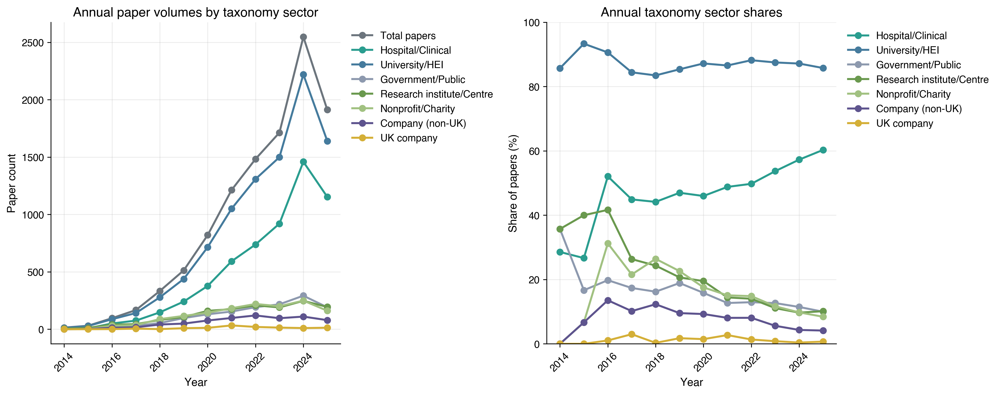

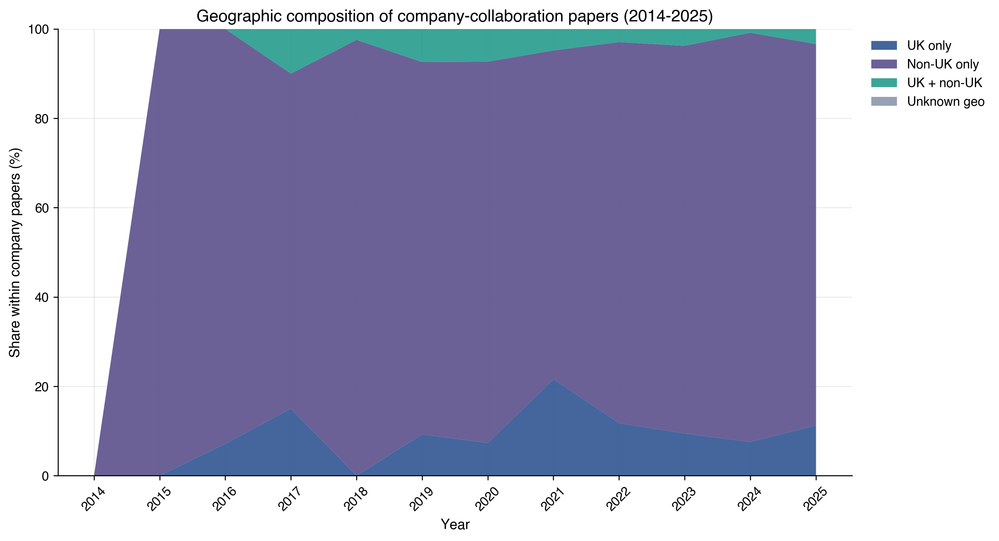

Company collaborator churn (new vs returning):


,year,active_company_collaborators,new_company_collaborators,returning_company_collaborators,new_share_pct
0,2014,0,0,0,0.000000
1,2015,3,3,0,100.000000
2,2016,10,9,1,90.000000
3,2017,17,12,5,70.588235
4,2018,21,13,8,61.904762
5,2019,39,24,15,61.538462
6,2020,52,26,26,50.000000
7,2021,67,32,35,47.761194
8,2022,76,27,49,35.526316
9,2023,64,24,40,37.500000


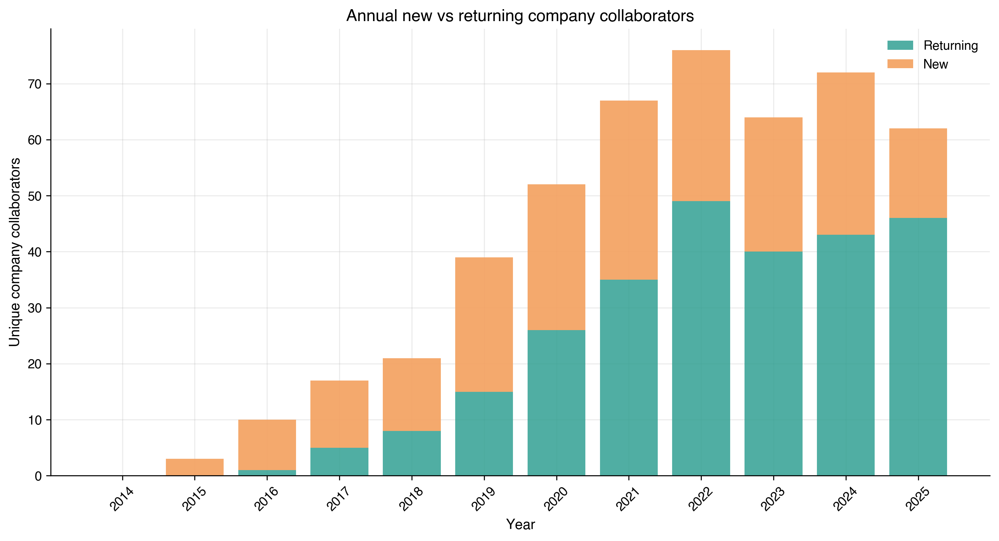

Top company collaborators by year matrix:


,org,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
0,Decode Genetics ehf,0,0,6,5,13,9,10,11,15,16,10,2
1,23andMe Inc,0,0,7,4,11,16,9,10,7,6,5,2
2,Regeneron Pharmaceuticals Inc,0,0,0,2,3,0,11,15,12,10,20,1
3,Novo Nordisk Research Centre Oxford Ltd,0,0,0,0,0,0,3,9,16,4,6,7
4,Genentech Inc,0,0,1,0,0,1,6,4,7,5,3,2
5,GlaxoSmithKline LLC,0,0,0,1,0,6,6,4,4,2,1,2
6,Verve Therapeutics Inc,0,0,0,0,0,2,8,0,9,5,2,0
7,Biogen Inc,0,0,0,0,0,1,1,5,6,3,4,5
8,Calico Life Sciences LLC,0,0,0,0,0,1,1,3,5,5,4,5
9,Fimlab (Finland),0,1,5,2,1,2,4,4,1,2,1,1


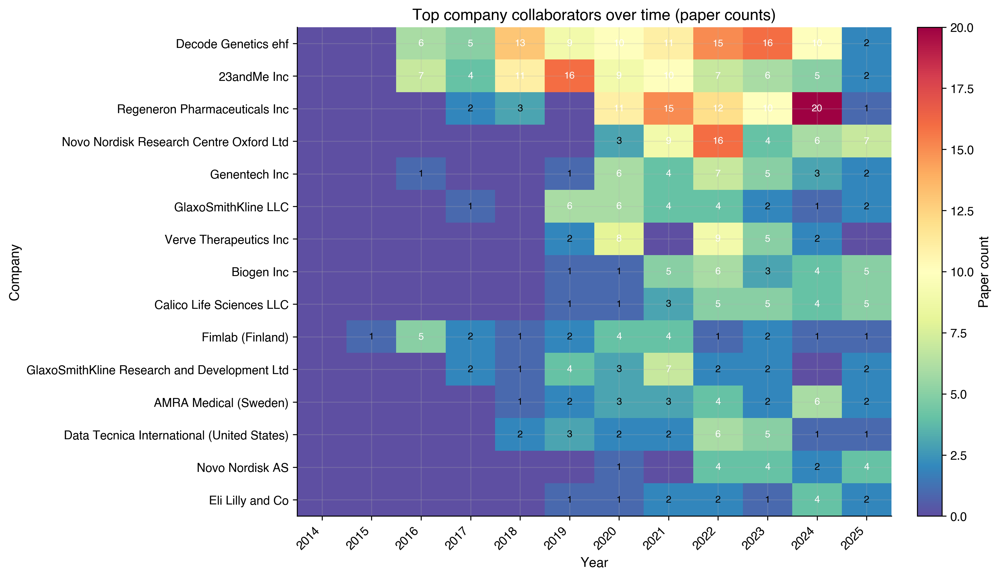

In [8]:
yearly_metrics_df = h.build_yearly_metrics_table(df, start_year=2014, end_year=2025)
print("Yearly collaboration metrics:")
display(yearly_metrics_df)

h.plot_yearly_metrics_dashboard(yearly_metrics_df)
h.plot_company_geography_mix_over_time(df, start_year=2014, end_year=2025)

company_churn_df = h.build_company_collaborator_churn_table(df, start_year=2014, end_year=2025)
print("Company collaborator churn (new vs returning):")
display(company_churn_df)

h.plot_new_vs_returning_company_collaborators(company_churn_df)

top_company_year_df = h.build_top_company_year_matrix(df, top_n=15, start_year=2014, end_year=2025)
print("Top company collaborators by year matrix:")
display(top_company_year_df)

h.plot_top_company_heatmap(top_company_year_df)


## 8. FoR 2020 Level-2 Analysis

FoR level-2 labels are parsed from `category_for_2020` and reported using discipline names (not only numeric codes).


Papers with parsed category_for_2020 level-2 codes: 10835
Unique parsed level-2 codes: 19


,l2_for_name,code,papers,share_hospital_clinical,share_university_hei,share_company_non_uk,share_uk_company
0,Biomedical and Clinical Sciences,32,6553,0.568747,0.864642,0.054784,0.009614
1,Health Sciences,42,3926,0.503311,0.871116,0.051961,0.009424
2,Biological Sciences,31,2420,0.508678,0.878512,0.141736,0.020661
3,Psychology,52,979,0.501532,0.920327,0.049030,0.002043
4,Mathematical Sciences,49,266,0.338346,0.860902,0.075188,0.011278
5,Environmental Sciences,41,152,0.467105,0.881579,0.006579,0.000000
6,Information and Computing Sciences,46,148,0.283784,0.817568,0.121622,0.020270
7,Engineering,40,90,0.433333,0.866667,0.066667,0.011111
8,Chemical Sciences,34,51,0.431373,0.862745,0.000000,0.000000
9,Human Society,44,44,0.159091,0.977273,0.022727,0.000000


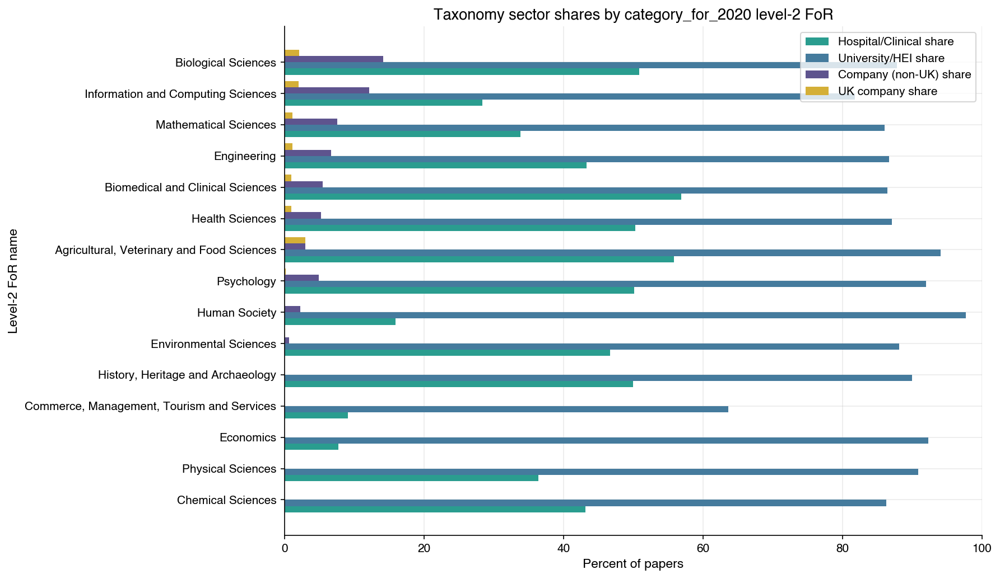

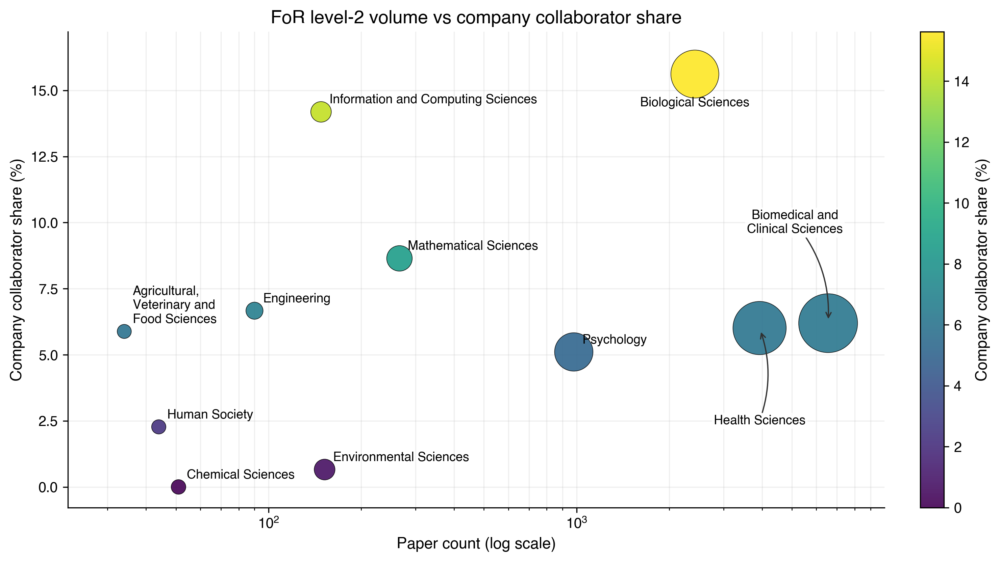

,l2_for_name,code,papers,uk_company_share
0,"Agricultural, Veterinary and Food Sciences",30,34,0.029412
1,Biological Sciences,31,2420,0.020661
2,Information and Computing Sciences,46,148,0.020270
3,Mathematical Sciences,49,266,0.011278
4,Engineering,40,90,0.011111
5,Biomedical and Clinical Sciences,32,6553,0.009614
6,Health Sciences,42,3926,0.009424
7,Psychology,52,979,0.002043
8,Economics,38,13,0.000000
9,Environmental Sciences,41,152,0.000000


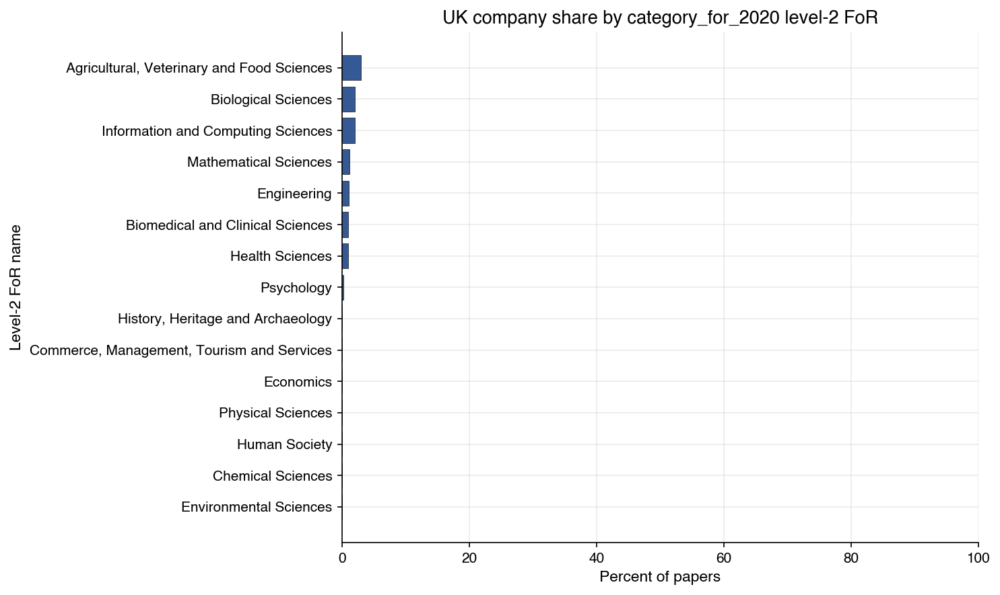

In [9]:
df, for_name_map = h.add_for_level2_columns(df)

if "category_for_2020_lvl2" in df.columns:
    n_with_lvl2 = int((df["category_for_2020_lvl2"].map(len) > 0).sum())
    unique_lvl2 = len({code for codes in df["category_for_2020_lvl2"] for code in codes})
    print(f"Papers with parsed category_for_2020 level-2 codes: {n_with_lvl2}")
    print(f"Unique parsed level-2 codes: {unique_lvl2}")
else:
    print("Column category_for_2020 not found or no level-2 parsing available.")

for_share_df = h.build_for_share_table(df, for_name_map)
if for_share_df.empty:
    print("No category_for_2020 level-2 codes found to plot.")
else:
    display(
        for_share_df[[
            "l2_for_name",
            "code",
            "papers",
            "share_hospital_clinical",
            "share_university_hei",
            "share_company_non_uk",
            "share_uk_company",
        ]]
        .sort_values("papers", ascending=False)
        .head(15)
        .reset_index(drop=True)
    )
    h.plot_for_share_table(for_share_df, top_n=15)
    h.plot_for_company_share_scatter(for_share_df, min_papers=30, max_labels=10)

uk_for_df = h.build_uk_company_for_table(df, for_name_map)
if uk_for_df.empty:
    print("No category_for_2020 level-2 codes found to plot.")
else:
    display(
        uk_for_df[["l2_for_name", "code", "papers", "uk_company_share"]]
        .sort_values("uk_company_share", ascending=False)
        .head(15)
        .reset_index(drop=True)
    )
    h.plot_uk_company_for_table(uk_for_df, top_n=15)


## 9. Geography of Collaborators

Country counts are matched from taxonomy-derived collaborator organization sets at paper level (with fallback to `research_org_country_names` where needed).


Top taxonomy-collaborator countries (all sectors combined):


,country,n_pubs,country_norm
0,China,38603,China
1,United States,29368,United States of America
2,United Kingdom,20586,United Kingdom
3,Australia,4596,Australia
4,Germany,3305,Germany
5,Netherlands,3082,Netherlands
6,Canada,3027,Canada
7,South Korea,2262,South Korea
8,Norway,2035,Norway
9,Denmark,1968,Denmark


Top company-sector collaborator countries:


,country,n_pubs,country_norm
0,United States,1466,United States of America
1,Iceland,728,Iceland
2,United Kingdom,261,United Kingdom
3,Germany,115,Germany
4,Sweden,72,Sweden
5,China,52,China
6,Australia,34,Australia
7,Denmark,28,Denmark
8,India,14,India
9,South Korea,13,South Korea


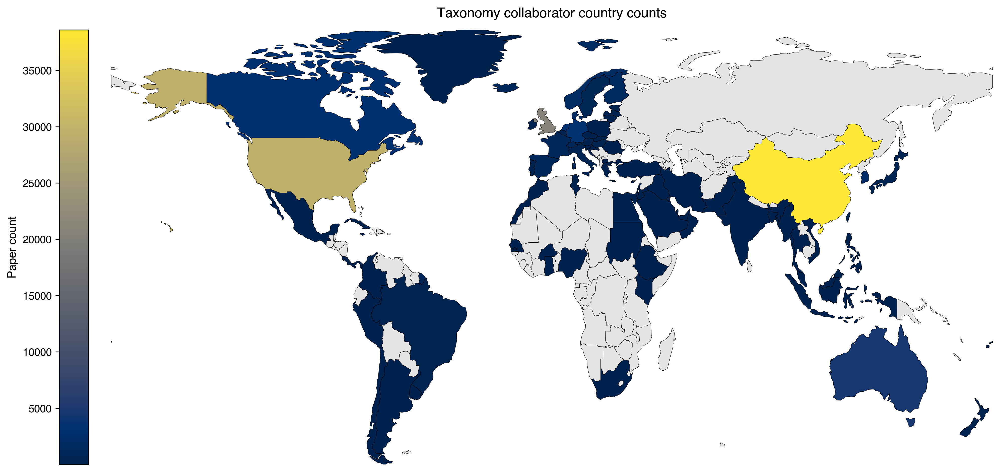

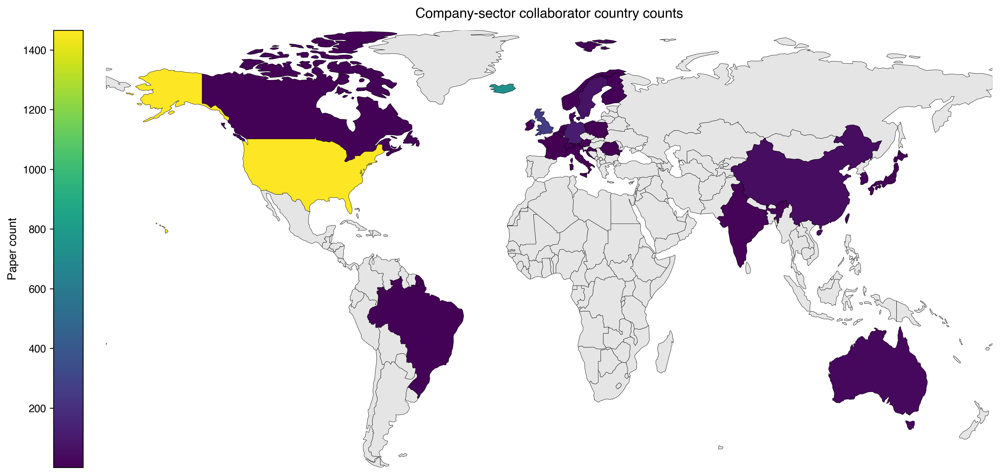

In [10]:
df = h.add_country_columns(df)

non_country_df = h.build_country_count_table(df["non_academic_countries"])
company_country_df = h.build_country_count_table(df["company_countries"])

print("Top taxonomy-collaborator countries (all sectors combined):")
display(non_country_df.sort_values("n_pubs", ascending=False).head(20).reset_index(drop=True))

print("Top company-sector collaborator countries:")
display(company_country_df.sort_values("n_pubs", ascending=False).head(20).reset_index(drop=True))

world = h.load_world_geodata()
h.plot_country_map(non_country_df, "Taxonomy collaborator country counts", cmap_name="cividis", world=world)
h.plot_country_map(company_country_df, "Company-sector collaborator country counts", cmap_name="viridis", world=world)


## 10. Top-Cited Papers

Top-five cited papers are shown for selected taxonomy sectors,
formatted as: first author surname (`et al.` when multiple authors), year, title, journal, DOI, citation count.


In [11]:
sections = h.build_top_cited_sections(df, top_n=5, citation_col="times_cited")

for heading, refs in sections.items():
    print()
    print(f"{heading}:")
    for i, ref in enumerate(refs, start=1):
        print(f"{i}. {ref}")



Top 5 cited papers with Hospital/Clinical collaborations:
1. Wray et al. (2018), Genome-wide association analyses identify 44 risk variants and refine the genetic architecture of major depression, Nature Genetics, https://doi.org/10.1038/s41588-018-0090-3, 2858
2. Khera et al. (2018), Genome-wide polygenic scores for common diseases identify individuals with risk equivalent to monogenic mutations, Nature Genetics, https://doi.org/10.1038/s41588-018-0183-z, 2754
3. Howard et al. (2019), Genome-wide meta-analysis of depression identifies 102 independent variants and highlights the importance of the prefrontal brain regions, Nature Neuroscience, https://doi.org/10.1038/s41593-018-0326-7, 2357
4. Lee et al. (2018), Gene discovery and polygenic prediction from a genome-wide association study of educational attainment in 1.1 million individuals, Nature Genetics, https://doi.org/10.1038/s41588-018-0147-3, 2325
5. Jansen et al. (2019), Genome-wide meta-analysis identifies new loci and functio

## 11. Publication Figure

A single 2x2 composite figure for publication use.


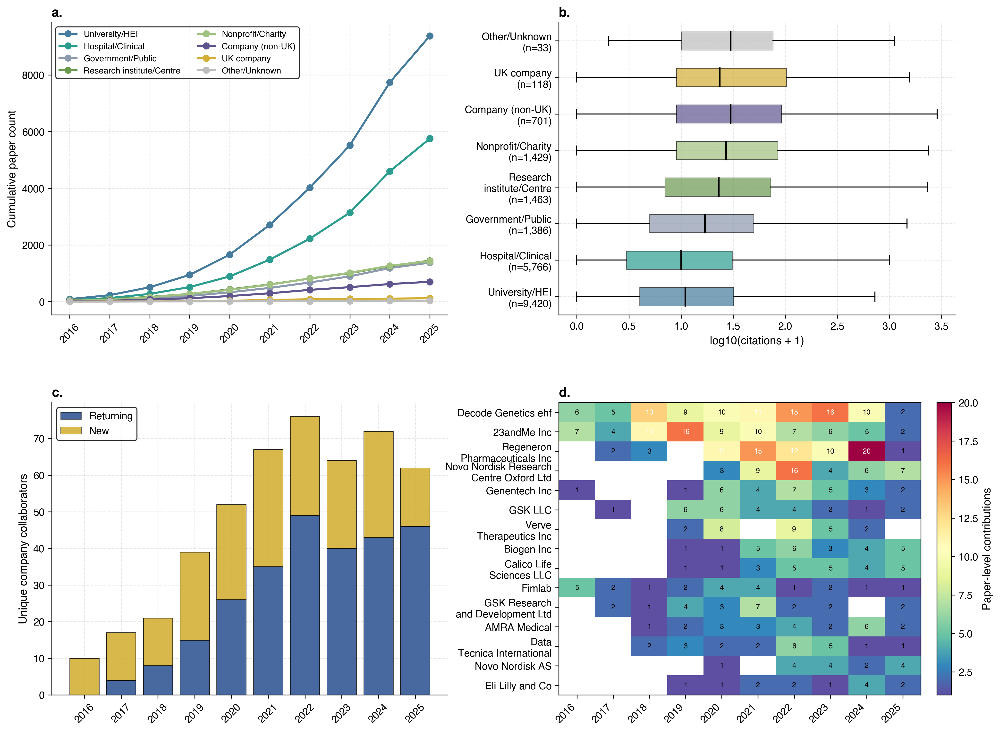

In [12]:
saved_pubfig = h.plot_publication_figure(
    df,
    start_year=2016,
    end_year=2025,
    citation_col="times_cited",
    top_company_n=15,
)